In [121]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15,8)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

<Figure size 3750x2000 with 0 Axes>

**Forest Fires Dataset**

In [122]:
from google.colab import files
uploaded=files.upload()

Saving forestfires.csv to forestfires (1).csv


In [123]:
forest=pd.read_csv('forestfires.csv')
forest

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


In [124]:
forest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

In [125]:
forest.describe()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,...,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,0.164410,...,0.017408,0.038685,0.003868,0.061896,0.032882,0.104449,0.003868,0.001934,0.029014,0.332689
std,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,0.371006,...,0.130913,0.193029,0.062137,0.241199,0.178500,0.306138,0.062137,0.043980,0.168007,0.471632
min,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [126]:
forest.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

In [127]:
forest[forest.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,...,0,0,0,0,1,0,0,0,0,large
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,...,0,0,0,1,0,0,0,0,0,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small
461,aug,sat,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
501,aug,tue,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,...,0,0,0,0,0,0,0,0,0,small
508,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,...,0,0,0,0,0,0,0,0,0,small


In [128]:
forest.drop_duplicates(inplace=True)

In [129]:
forest[forest.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category


In [130]:
forest.reset_index(inplace=True)
forest.drop(columns="index", inplace=True)
forest

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


<Axes: >

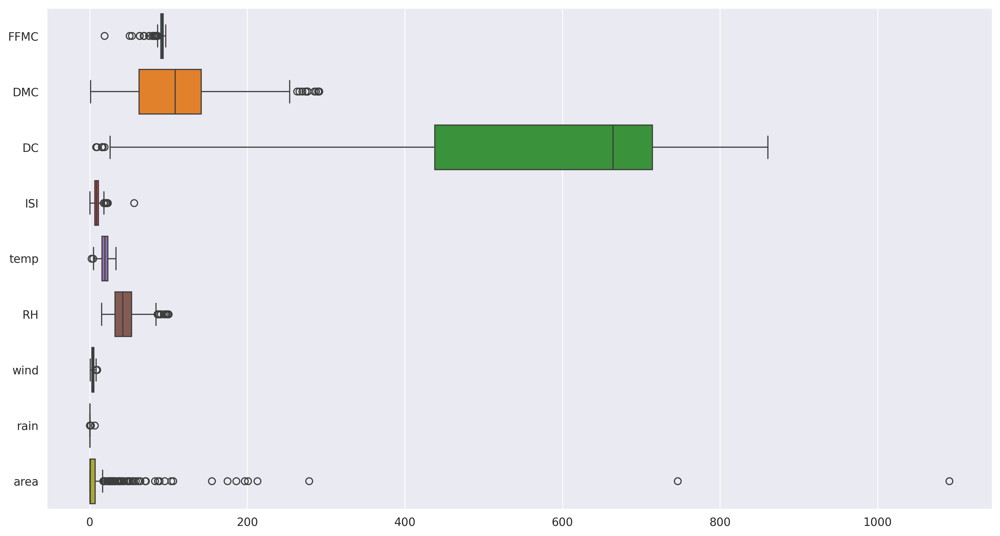

In [131]:
sns.cubehelix_palette(as_cmap=True)
sns.boxplot(data=forest.iloc[:,2:11], orient='h')

array([[<Axes: title={'center': 'FFMC'}>,
        <Axes: title={'center': 'DMC'}>, <Axes: title={'center': 'DC'}>],
       [<Axes: title={'center': 'ISI'}>,
        <Axes: title={'center': 'temp'}>, <Axes: title={'center': 'RH'}>],
       [<Axes: title={'center': 'wind'}>,
        <Axes: title={'center': 'rain'}>,
        <Axes: title={'center': 'area'}>]], dtype=object)

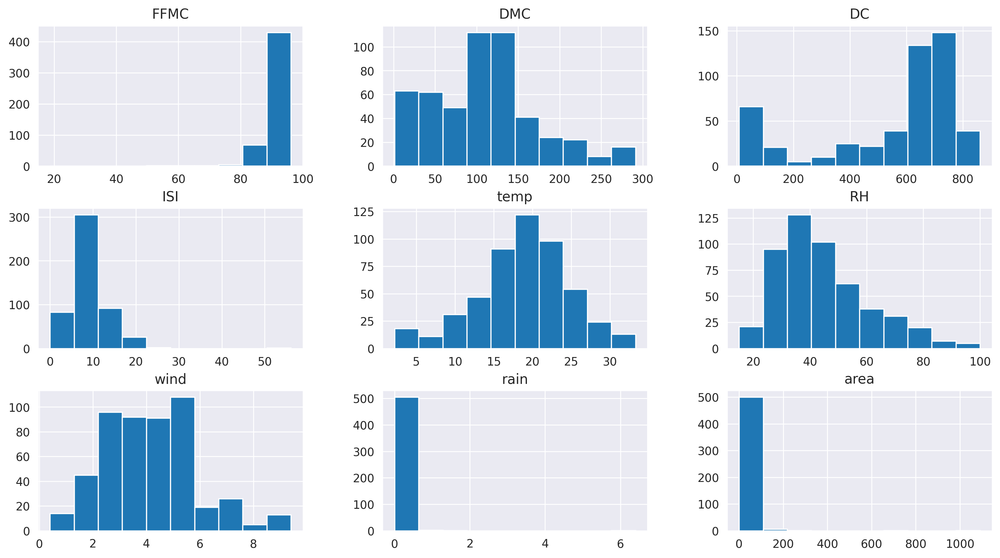

In [132]:
forest.iloc[:,2:11].hist()

In [133]:
p = forest.iloc[:,2:11]
p['s'] = forest['size_category']

p

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,s
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,small
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,small
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,small
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,small
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,small
...,...,...,...,...,...,...,...,...,...,...
504,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,large
505,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,large
506,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,large
507,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,small


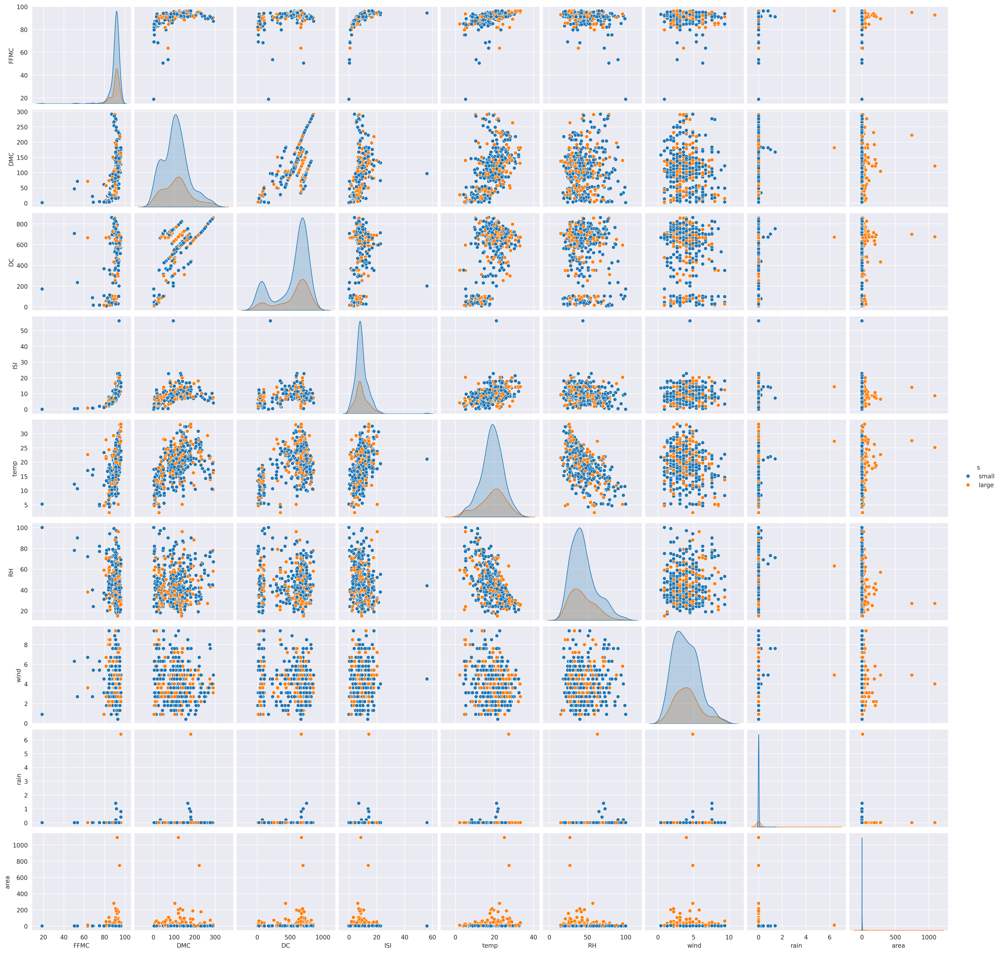

In [134]:
sns.pairplot(p, hue='s')

plt.show()

<Axes: >

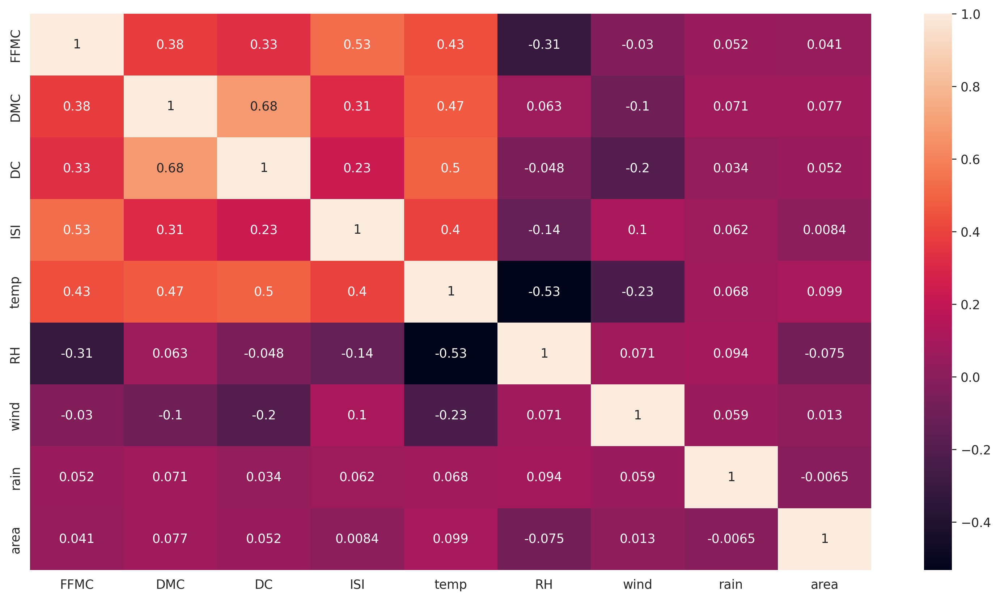

In [135]:
sns.heatmap(p.iloc[:,:-1].corr(), annot = True)

In [136]:
le = LabelEncoder()

In [137]:
forest['size_category'] = le.fit_transform(forest['size_category'])

forest

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,1
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,1
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,1
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,1
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,0
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,0
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,0
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,1


In [138]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')

In [139]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)

In [140]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)

    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st

In [141]:
outlier_percentage(forest.iloc[:,2:11])

FFMC : 10.412573673870334 %
DMC : 3.143418467583497 %
DC : 1.5717092337917484 %
ISI : 2.75049115913556 %
temp : 0.3929273084479371 %
RH : 2.161100196463654 %
wind : 2.5540275049115913 %
rain : 1.37524557956778 %
area : 12.180746561886052 %


In [142]:
If = IsolationForest()
If.fit(forest.iloc[:,2:11])
outliers = If.predict(forest.iloc[:,2:11])
outliers

array([ 1,  1,  1, -1, -1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
        1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,
       -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1

In [143]:
forest['Outliers'] = outliers
forest

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category,Outliers
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,1,0,0,0,0,1,1
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,1,0,1,1
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,1,0,1,1
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,1,0,0,0,0,1,-1
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,1,0,0,0,0,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,1
505,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,-1
506,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,-1
507,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,1,1


In [144]:
forest.drop(forest[forest['Outliers']==-1].index, inplace=True)

In [145]:
outlier_percentage(forest.iloc[:,2:11])

FFMC : 7.391304347826087 %
DMC : 4.3478260869565215 %
DC : 15.434782608695652 %
ISI : 5.869565217391305 %
temp : 1.956521739130435 %
RH : 1.5217391304347827 %
wind : 0.6521739130434783 %
rain : 0.0 %
area : 11.956521739130435 %


In [146]:
replace_outlier_extream(forest, 'FFMC')
pe.box(forest['FFMC'],orientation = 'h')

In [147]:
replace_outlier_extream(forest, 'DMC')
pe.box(forest['DMC'], orientation = 'h')

In [148]:
replace_outlier_extream(forest, 'DC')
pe.box(forest['DC'], orientation = 'h')

In [149]:
replace_outlier_extream(forest, 'ISI')
pe.box(forest['ISI'], orientation = 'h')

In [150]:
replace_outlier_extream(forest, 'area')
pe.box(forest['area'], orientation = 'h')

In [151]:
outlier_percentage(forest.iloc[:,2:11])

FFMC : 0.0 %
DMC : 0.0 %
DC : 0.0 %
ISI : 0.0 %
temp : 1.956521739130435 %
RH : 1.5217391304347827 %
wind : 0.6521739130434783 %
rain : 0.0 %
area : 0.0 %


In [152]:
forest.reset_index(inplace=True)
forest.drop(columns=['index', 'Outliers'], inplace=True)

forest

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,87.0875,26.2,147.35,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,1
1,oct,tue,90.6000,35.4,669.10,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,1
2,oct,sat,90.6000,43.7,686.90,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,1
3,aug,sun,92.3000,85.3,488.00,14.7,22.2,29,5.4,0.0,...,0,0,0,0,0,0,0,0,0,1
4,aug,mon,92.3000,88.9,495.60,8.5,24.1,27,3.1,0.0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,aug,fri,91.0000,166.9,752.60,7.1,18.2,62,5.4,0.0,...,0,0,0,0,0,0,0,0,0,1
456,aug,sun,87.0875,56.7,665.60,1.9,27.8,35,2.7,0.0,...,0,0,0,0,0,0,0,0,0,1
457,aug,sun,87.0875,56.7,665.60,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,0
458,aug,sat,94.4000,146.0,614.70,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,1


In [153]:
x = forest.iloc[:,2:-1]
y = forest['size_category']

In [154]:
x

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
0,87.0875,26.2,147.35,5.1,8.2,51,6.7,0.0,0.00,1,...,0,0,0,0,0,1,0,0,0,0
1,90.6000,35.4,669.10,6.7,18.0,33,0.9,0.0,0.00,0,...,0,0,0,0,0,0,0,0,1,0
2,90.6000,43.7,686.90,6.7,14.6,33,1.3,0.0,0.00,0,...,0,0,0,0,0,0,0,0,1,0
3,92.3000,85.3,488.00,14.7,22.2,29,5.4,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
4,92.3000,88.9,495.60,8.5,24.1,27,3.1,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,91.0000,166.9,752.60,7.1,18.2,62,5.4,0.0,0.43,1,...,0,0,0,0,0,0,0,0,0,0
456,87.0875,56.7,665.60,1.9,27.8,35,2.7,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0
457,87.0875,56.7,665.60,1.9,27.8,32,2.7,0.0,6.44,0,...,0,0,0,0,0,0,0,0,0,0
458,94.4000,146.0,614.70,11.3,25.6,42,4.0,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,0


In [155]:
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)
scaled_x

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
0,-2.093124,-1.492487,-2.012647,-1.106855,-2.110357,0.590606,1.775424,0.0,-0.689032,2.283904,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,2.896162,-0.066082,-0.046676,-0.183597,-0.747878
1,-0.456815,-1.330542,0.437858,-0.652241,-0.269191,-0.669760,-1.809554,0.0,-0.689032,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,5.446712,-0.747878
2,-0.456815,-1.184440,0.521459,-0.652241,-0.907963,-0.669760,-1.562314,0.0,-0.689032,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,5.446712,-0.747878
3,0.335136,-0.452170,-0.412715,1.620828,0.519880,-0.949841,0.971895,0.0,-0.689032,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,-0.183597,-0.747878
4,0.335136,-0.388800,-0.377020,-0.140801,0.876841,-1.089882,-0.449735,0.0,-0.689032,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,-0.183597,-0.747878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,-0.270473,0.984206,0.830032,-0.538588,-0.231616,1.360830,0.971895,0.0,-0.605643,2.283904,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,-0.183597,-0.747878
456,-2.093124,-0.955606,0.421419,-2.016083,1.571975,-0.529719,-0.696975,0.0,-0.689032,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,-0.183597,-0.747878
457,-2.093124,-0.955606,0.421419,-2.016083,1.571975,-0.739780,-0.696975,0.0,0.559874,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,-0.183597,-0.747878
458,1.313428,0.616311,0.182357,0.654774,1.158652,-0.039577,0.106555,0.0,-0.689032,-0.437847,...,-0.066082,-0.156521,0.0,-0.259394,-0.170537,-0.345285,-0.066082,-0.046676,-0.183597,-0.747878


In [156]:
xtrain,xtest,ytrain,ytest = train_test_split(scaled_x,y,train_size=0.75,random_state=1)

**Preparing Model**

In [157]:
ann_def =Sequential()

In [158]:
ann_def.add(Dense(units=30, activation='relu'))
ann_def.add(Dense(units=20, activation='relu'))

In [159]:
ann_def.add(Dense(units=1, activation='sigmoid'))

In [160]:
ann_def.compile(optimizer='adam', loss='binary_crossentropy')

In [161]:
ann_def.fit(xtrain, ytrain, validation_data = (xtest, ytest), epochs = 50)

Epoch 1/50
11/11 [==============================] - 1s 21ms/step - loss: 0.6174 - val_loss: 0.5622
Epoch 2/50
11/11 [==============================] - 0s 5ms/step - loss: 0.5616 - val_loss: 0.5179
Epoch 3/50
11/11 [==============================] - 0s 5ms/step - loss: 0.5168 - val_loss: 0.4803
Epoch 4/50
11/11 [==============================] - 0s 6ms/step - loss: 0.4756 - val_loss: 0.4476
Epoch 5/50
11/11 [==============================] - 0s 6ms/step - loss: 0.4390 - val_loss: 0.4143
Epoch 6/50
11/11 [==============================] - 0s 5ms/step - loss: 0.4020 - val_loss: 0.3811
Epoch 7/50
11/11 [==============================] - 0s 6ms/step - loss: 0.3665 - val_loss: 0.3489
Epoch 8/50
11/11 [==============================] - 0s 6ms/step - loss: 0.3318 - val_loss: 0.3184
Epoch 9/50
11/11 [==============================] - 0s 7ms/step - loss: 0.2976 - val_loss: 0.2881
Epoch 10/50
11/11 [==============================] - 0s 7ms/step - loss: 0.2654 - val_loss: 0.2607
Epoch 11/50
11/11 

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

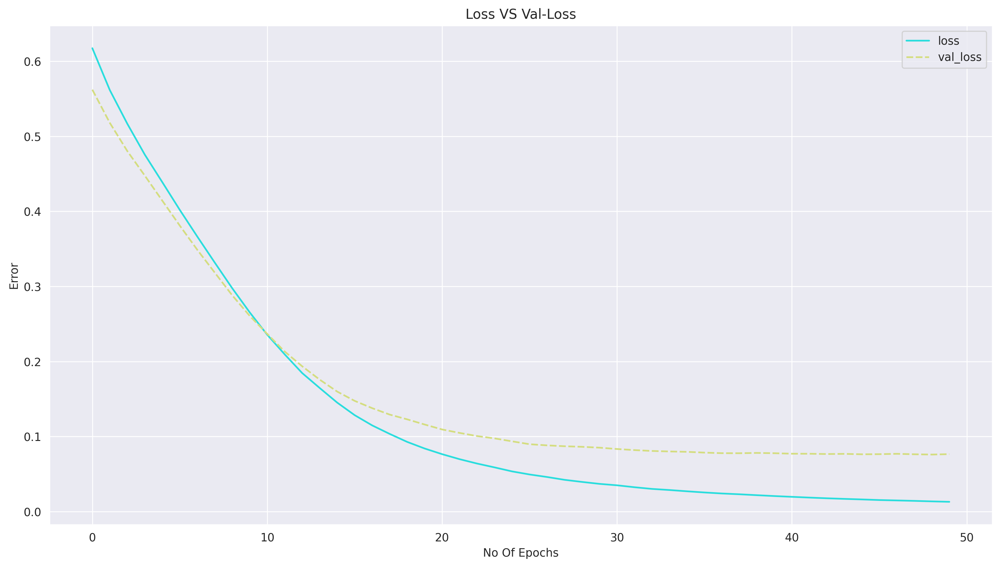

In [162]:
val_loss_def = pd.DataFrame(ann_def.history.history)

sns.lineplot(data = val_loss_def, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

In [163]:
ypred_def = ann_def.predict(xtest)
ypred_def = ypred_def > 0.5

4/4 [==============================] - 0s 3ms/step


In [164]:
print(classification_report(ytest,ypred_def))

              precision    recall  f1-score   support

           0       1.00      0.88      0.93        24
           1       0.97      1.00      0.98        91

    accuracy                           0.97       115
   macro avg       0.98      0.94      0.96       115
weighted avg       0.97      0.97      0.97       115



**Creating Model with Early Stopping**

In [165]:
early = EarlyStopping(monitor='val_loss',mode='min', patience=25)

In [166]:
ann_es =Sequential()

In [167]:
ann_es.add(Dense(units=30, activation='relu'))
ann_es.add(Dense(units=20, activation='relu'))

In [168]:
ann_es.add(Dense(units=1, activation='sigmoid'))

In [169]:
ann_es.compile(optimizer='adam', loss='binary_crossentropy')

In [170]:
ann_es.fit(xtrain, ytrain, validation_data = (xtest, ytest), callbacks=[early] , epochs = 100)

Epoch 1/100
11/11 [==============================] - 1s 22ms/step - loss: 0.7614 - val_loss: 0.7219
Epoch 2/100
11/11 [==============================] - 0s 5ms/step - loss: 0.6798 - val_loss: 0.6567
Epoch 3/100
11/11 [==============================] - 0s 5ms/step - loss: 0.6206 - val_loss: 0.6128
Epoch 4/100
11/11 [==============================] - 0s 7ms/step - loss: 0.5783 - val_loss: 0.5797
Epoch 5/100
11/11 [==============================] - 0s 7ms/step - loss: 0.5426 - val_loss: 0.5512
Epoch 6/100
11/11 [==============================] - 0s 7ms/step - loss: 0.5125 - val_loss: 0.5241
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 0.4815 - val_loss: 0.4991
Epoch 8/100
11/11 [==============================] - 0s 8ms/step - loss: 0.4527 - val_loss: 0.4731
Epoch 9/100
11/11 [==============================] - 0s 7ms/step - loss: 0.4231 - val_loss: 0.4465
Epoch 10/100
11/11 [==============================] - 0s 7ms/step - loss: 0.3933 - val_loss: 0.4205
Epoch 11

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

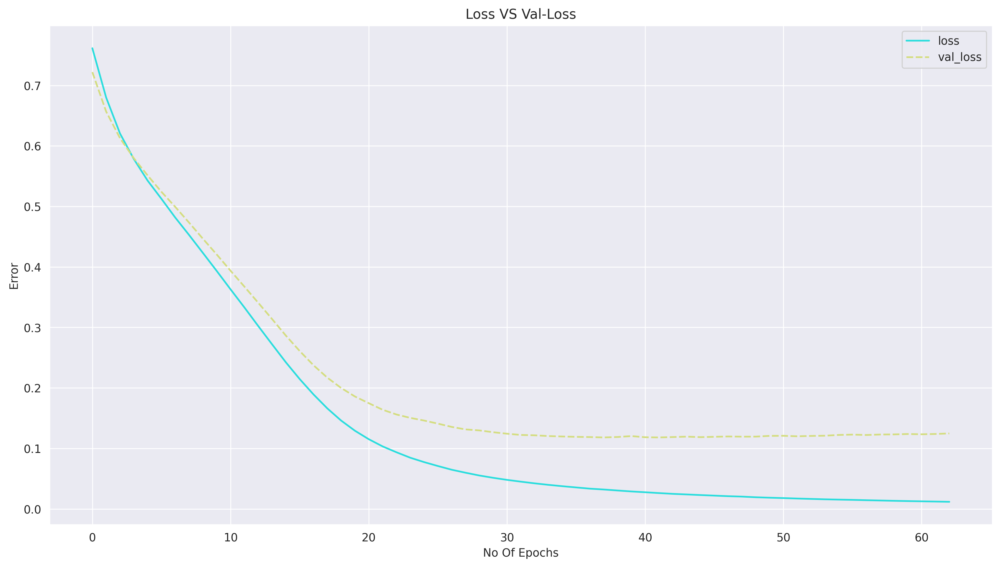

In [171]:
val_loss_es = pd.DataFrame(ann_es.history.history)

sns.lineplot(data = val_loss_es, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

In [172]:
ypred_es = ann_es.predict(xtest)
ypred_es = ypred_es > 0.5

4/4 [==============================] - 0s 3ms/step


In [173]:
print(classification_report(ytest,ypred_es))

              precision    recall  f1-score   support

           0       0.96      0.92      0.94        24
           1       0.98      0.99      0.98        91

    accuracy                           0.97       115
   macro avg       0.97      0.95      0.96       115
weighted avg       0.97      0.97      0.97       115



**Creating Model with Drop Out Layer**

In [174]:
ann_dol =Sequential()

In [175]:
ann_dol.add(Dense(units=30, activation='relu'))
ann_dol.add(Dropout(rate=0.5))

ann_dol.add(Dense(units=20, activation='relu'))
ann_dol.add(Dropout(rate=0.5))

In [176]:
ann_dol.add(Dense(units=1, activation='sigmoid'))

In [177]:
ann_dol.compile(optimizer='adam', loss='binary_crossentropy')

In [178]:
ann_dol.fit(xtrain, ytrain, validation_data = (xtest, ytest), epochs = 50)

Epoch 1/50
11/11 [==============================] - 1s 21ms/step - loss: 0.8942 - val_loss: 0.7284
Epoch 2/50
11/11 [==============================] - 0s 7ms/step - loss: 0.8346 - val_loss: 0.6586
Epoch 3/50
11/11 [==============================] - 0s 6ms/step - loss: 0.7290 - val_loss: 0.6115
Epoch 4/50
11/11 [==============================] - 0s 7ms/step - loss: 0.7118 - val_loss: 0.5790
Epoch 5/50
11/11 [==============================] - 0s 5ms/step - loss: 0.6453 - val_loss: 0.5562
Epoch 6/50
11/11 [==============================] - 0s 7ms/step - loss: 0.6252 - val_loss: 0.5371
Epoch 7/50
11/11 [==============================] - 0s 5ms/step - loss: 0.6606 - val_loss: 0.5223
Epoch 8/50
11/11 [==============================] - 0s 8ms/step - loss: 0.6047 - val_loss: 0.5103
Epoch 9/50
11/11 [==============================] - 0s 7ms/step - loss: 0.5722 - val_loss: 0.4993
Epoch 10/50
11/11 [==============================] - 0s 7ms/step - loss: 0.6161 - val_loss: 0.4886
Epoch 11/50
11/11 

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

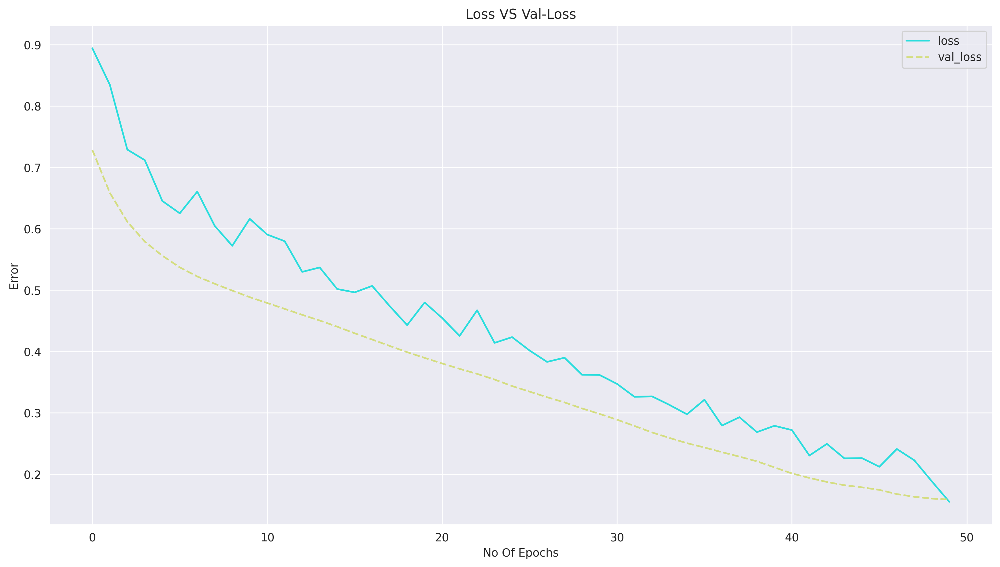

In [179]:
val_loss_dol = pd.DataFrame(ann_dol.history.history)

sns.lineplot(data = val_loss_dol, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

In [180]:
ypred_dol = ann_dol.predict(xtest)
ypred_dol = ypred_dol > 0.5

4/4 [==============================] - 0s 4ms/step


In [181]:
print(classification_report(ytest,ypred_dol))

              precision    recall  f1-score   support

           0       1.00      0.75      0.86        24
           1       0.94      1.00      0.97        91

    accuracy                           0.95       115
   macro avg       0.97      0.88      0.91       115
weighted avg       0.95      0.95      0.94       115



**Creating Model with Early Stopping and Drop Out Layer**

In [182]:
early = EarlyStopping(monitor='val_loss',mode='min', patience=25)

In [183]:
ann_all =Sequential()

In [184]:
ann_all.add(Dense(units=30, activation='relu'))
ann_all.add(Dropout(rate=0.5))

ann_all.add(Dense(units=20, activation='relu'))
ann_all.add(Dropout(rate=0.5))

In [185]:
ann_all.add(Dense(units=1, activation='sigmoid'))

In [187]:
ann_all.compile(optimizer='adam', loss='binary_crossentropy')

In [188]:
ann_all.fit(xtrain, ytrain, validation_data = (xtest, ytest), callbacks=[early] , epochs = 100)

Epoch 1/100
11/11 [==============================] - 1s 24ms/step - loss: 0.7416 - val_loss: 0.6523
Epoch 2/100
11/11 [==============================] - 0s 6ms/step - loss: 0.6649 - val_loss: 0.6294
Epoch 3/100
11/11 [==============================] - 0s 7ms/step - loss: 0.6840 - val_loss: 0.6100
Epoch 4/100
11/11 [==============================] - 0s 6ms/step - loss: 0.6247 - val_loss: 0.5932
Epoch 5/100
11/11 [==============================] - 0s 7ms/step - loss: 0.6402 - val_loss: 0.5781
Epoch 6/100
11/11 [==============================] - 0s 7ms/step - loss: 0.6155 - val_loss: 0.5664
Epoch 7/100
11/11 [==============================] - 0s 7ms/step - loss: 0.5942 - val_loss: 0.5526
Epoch 8/100
11/11 [==============================] - 0s 7ms/step - loss: 0.5871 - val_loss: 0.5388
Epoch 9/100
11/11 [==============================] - 0s 6ms/step - loss: 0.5675 - val_loss: 0.5256
Epoch 10/100
11/11 [==============================] - 0s 7ms/step - loss: 0.5669 - val_loss: 0.5130
Epoch 11

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

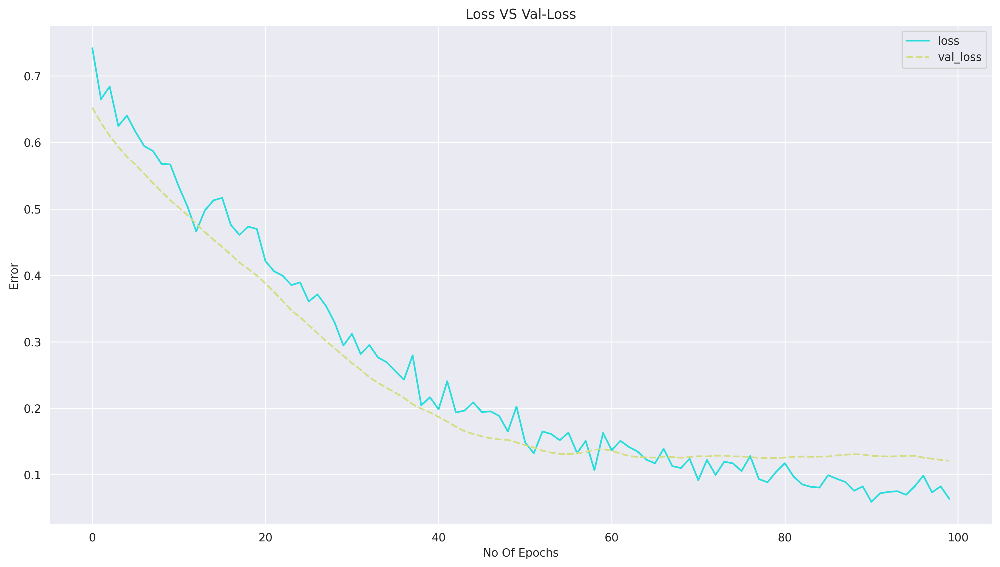

In [190]:
val_loss_all = pd.DataFrame(ann_all.history.history)

sns.lineplot(data = val_loss_all, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

In [191]:
ypred_all = ann_all.predict(xtest)
ypred_all = ypred_all > 0.5

4/4 [==============================] - 0s 3ms/step


In [192]:
print(classification_report(ytest,ypred_all))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91        24
           1       0.97      0.99      0.98        91

    accuracy                           0.97       115
   macro avg       0.96      0.93      0.95       115
weighted avg       0.96      0.97      0.96       115



**Comparing All Model**

<Axes: title={'center': 'Model With Early Stop And Drop Out Layer'}>

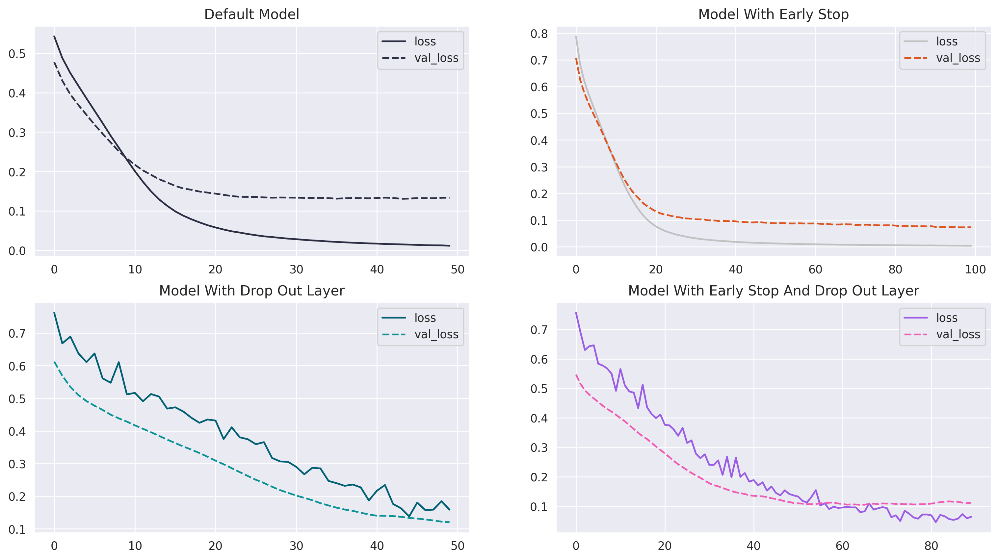

In [70]:
fig, ax = plt.subplots(2, 2)

ax[0, 0].title.set_text('Default Model')
sns.lineplot(data=val_loss_def, ax = ax[0, 0], palette = ['#2b2d42', '#2d3047'])

ax[0, 1].title.set_text('Model With Early Stop')
sns.lineplot(data=val_loss_es, ax = ax[0, 1], palette = ['#c2c1c2', '#de541e'])

ax[1, 0].title.set_text('Model With Drop Out Layer')
sns.lineplot(data=val_loss_dol, ax = ax[1, 0], palette = ['#005f73', '#0a9396'])

ax[1, 1].title.set_text('Model With Early Stop And Drop Out Layer')
sns.lineplot(data=val_loss_all, ax = ax[1, 1], palette = [ '#9b5de5', '#f15bb5'])

**Gas Turbines Dataset**

In [71]:
from google.colab import files
uploaded=files.upload()

Saving gas_turbines.csv to gas_turbines.csv


In [72]:
gt=pd.read_csv('gas_turbines.csv')
gt

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.00,114.70,10.605,3.1547,82.722
1,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.00,114.72,10.598,3.2363,82.776
2,6.8977,1008.8,95.939,3.4824,19.779,1059.4,549.87,114.71,10.601,3.2012,82.468
3,7.0569,1009.2,95.249,3.4805,19.792,1059.6,549.99,114.72,10.606,3.1923,82.670
4,7.3978,1009.7,95.150,3.4976,19.765,1059.7,549.98,114.72,10.612,3.2484,82.311
...,...,...,...,...,...,...,...,...,...,...,...
15034,9.0301,1005.6,98.460,3.5421,19.164,1049.7,546.21,111.61,10.400,4.5186,79.559
15035,7.8879,1005.9,99.093,3.5059,19.414,1046.3,543.22,111.78,10.433,4.8470,79.917
15036,7.2647,1006.3,99.496,3.4770,19.530,1037.7,537.32,110.19,10.483,7.9632,90.912
15037,7.0060,1006.8,99.008,3.4486,19.377,1043.2,541.24,110.74,10.533,6.2494,93.227


In [73]:
gt.drop(columns = ['AFDP','GTEP','TIT','TAT','CDP','CO','NOX'], inplace = True)
gt

,AT,AP,AH,TEY
0,6.8594,1007.9,96.799,114.70
1,6.7850,1008.4,97.118,114.72
2,6.8977,1008.8,95.939,114.71
3,7.0569,1009.2,95.249,114.72
4,7.3978,1009.7,95.150,114.72
...,...,...,...,...
15034,9.0301,1005.6,98.460,111.61
15035,7.8879,1005.9,99.093,111.78
15036,7.2647,1006.3,99.496,110.19
15037,7.0060,1006.8,99.008,110.74


In [74]:
gt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15039 entries, 0 to 15038
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      15039 non-null  float64
 1   AP      15039 non-null  float64
 2   AH      15039 non-null  float64
 3   TEY     15039 non-null  float64
dtypes: float64(4)
memory usage: 470.1 KB


In [75]:
gt.describe()

,AT,AP,AH,TEY
count,15039.000000,15039.00000,15039.000000,15039.000000
mean,17.764381,1013.19924,79.124174,134.188464
std,7.574323,6.41076,13.793439,15.829717
min,0.522300,985.85000,30.344000,100.170000
25%,11.408000,1008.90000,69.750000,127.985000
50%,18.186000,1012.80000,82.266000,133.780000
75%,23.862500,1016.90000,90.043500,140.895000
max,34.929000,1034.20000,100.200000,174.610000


In [76]:
gt.isna().sum()

AT     0
AP     0
AH     0
TEY    0
dtype: int64

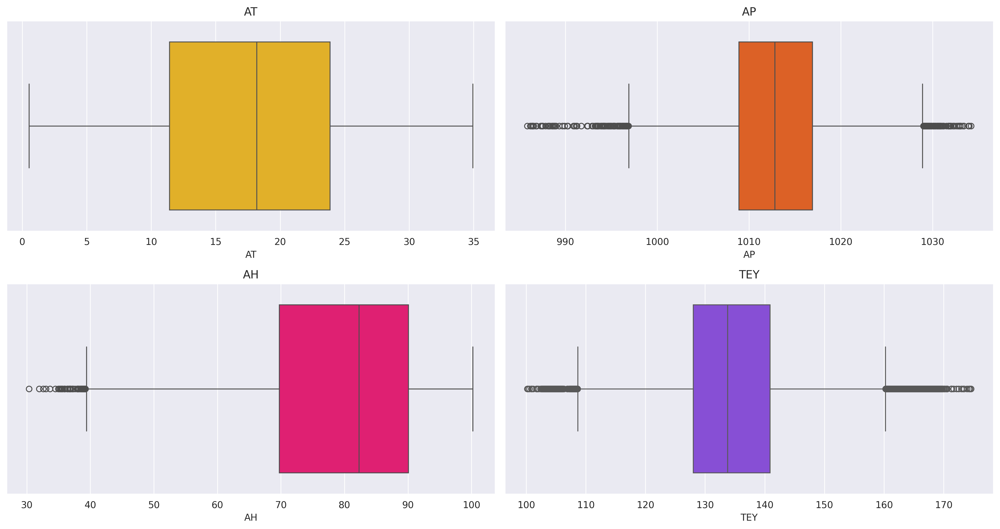

In [77]:
fig,ax = plt.subplots(2, 2)

ax[0, 0].title.set_text('AT')
sns.boxplot(gt['AT'], ax = ax[0, 0], palette = ['#ffbe0b'], orient = 'h')

ax[0, 1].title.set_text('AP')
sns.boxplot(gt['AP'], ax = ax[0, 1], palette = ['#fb5607'], orient = 'h')

ax[1, 0].title.set_text('AH')
sns.boxplot(gt['AH'], ax = ax[1, 0], palette = ['#ff006e'], orient = 'h')

ax[1, 1].title.set_text('TEY')
sns.boxplot(gt['TEY'], ax = ax[1, 1], palette = ['#8338ec'], orient = 'h')

plt.tight_layout()

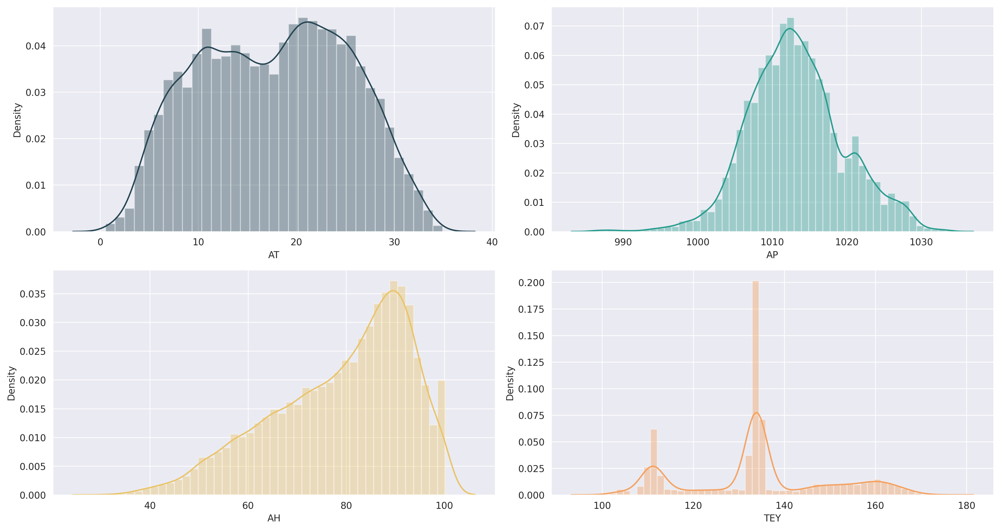

In [78]:
fig,ax = plt.subplots(2, 2)


sns.distplot(gt['AT'], ax = ax[0, 0], color = '#264653')


sns.distplot(gt['AP'], ax = ax[0, 1], color = '#2a9d8f')


sns.distplot(gt['AH'], ax = ax[1, 0], color = '#e9c46a')


sns.distplot(gt['TEY'], ax = ax[1, 1], color = '#f4a261')

plt.tight_layout()

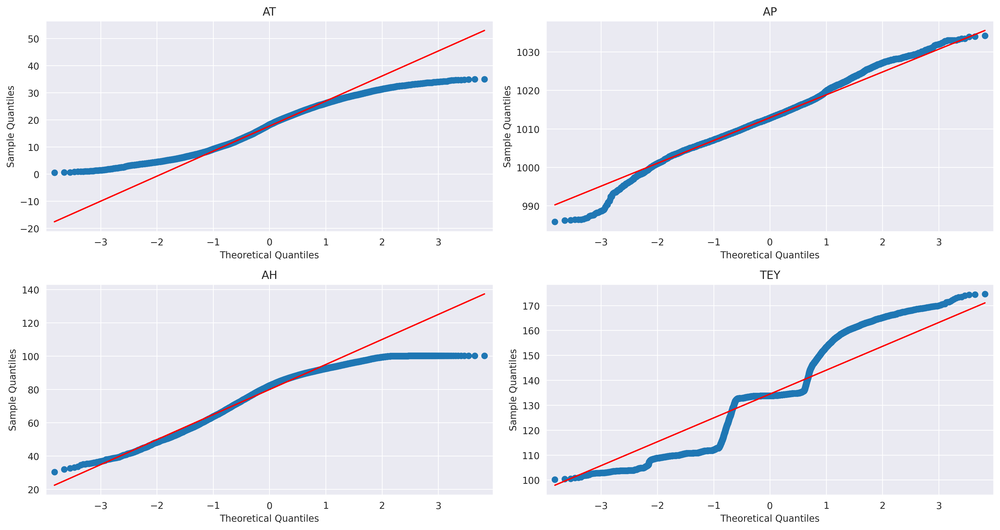

In [79]:
fig,ax = plt.subplots(2, 2)

ax[0, 0].title.set_text('AT')
sm.qqplot(gt['AT'], ax = ax[0, 0], line = 'q')

ax[0, 1].title.set_text('AP')
sm.qqplot(gt['AP'], ax = ax[0, 1], line = 'q')

ax[1, 0].title.set_text('AH')
sm.qqplot(gt['AH'], ax = ax[1, 0], line = 'q')

ax[1, 1].title.set_text('TEY')
sm.qqplot(gt['TEY'], ax = ax[1, 1], line = 'q')

plt.tight_layout()

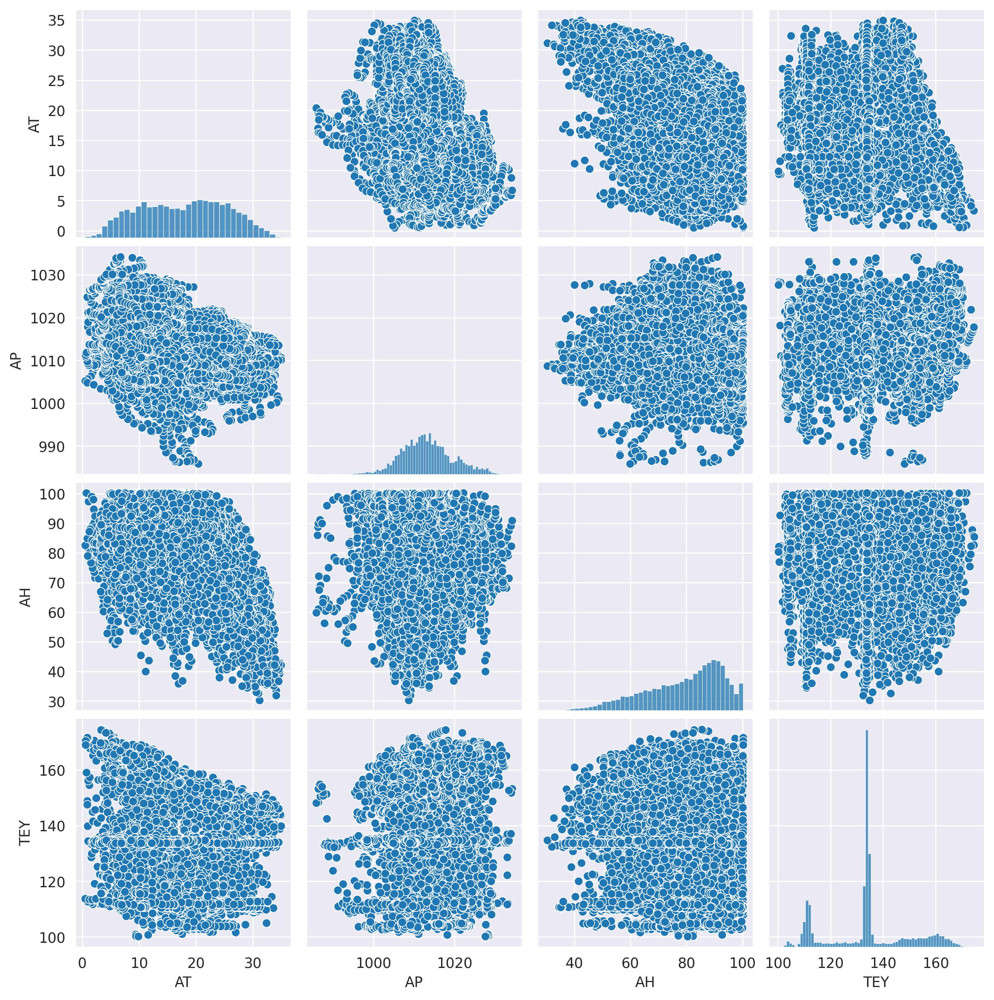

In [80]:
sns.pairplot(gt)

<Axes: >

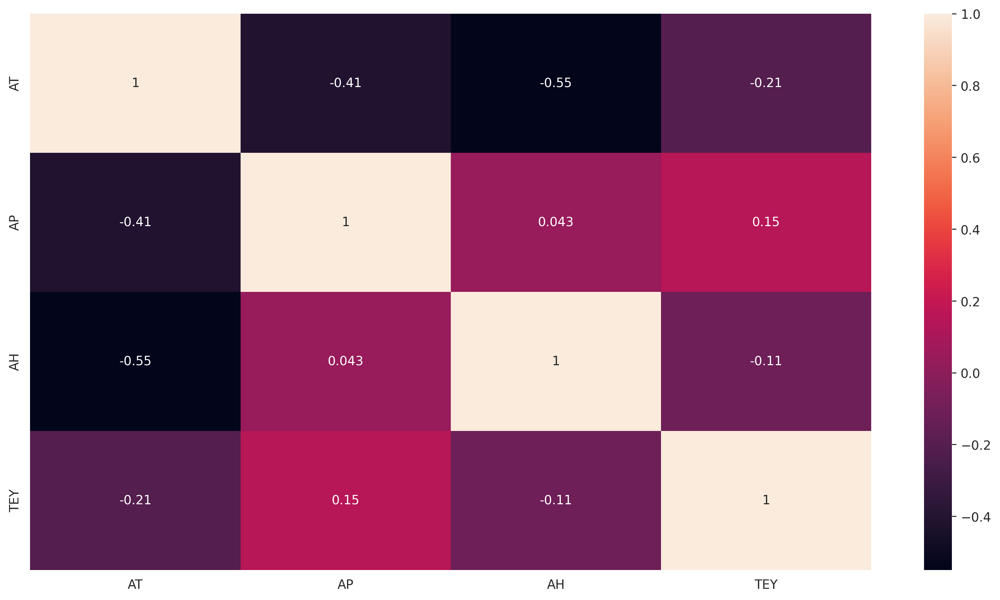

In [81]:
sns.heatmap(gt.corr(), annot=True)

In [82]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')

In [83]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)

In [84]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)

    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

In [85]:
outlier_percentage(gt)

AT : 0.0 %
AP : 1.4229669525899329 %
AH : 0.37236518385530953 %
TEY : 10.08710685550901 %


In [86]:
x = gt.iloc[:,:-1]
y = gt['TEY']

In [87]:
x

,AT,AP,AH
0,6.8594,1007.9,96.799
1,6.7850,1008.4,97.118
2,6.8977,1008.8,95.939
3,7.0569,1009.2,95.249
4,7.3978,1009.7,95.150
...,...,...,...
15034,9.0301,1005.6,98.460
15035,7.8879,1005.9,99.093
15036,7.2647,1006.3,99.496
15037,7.0060,1006.8,99.008


In [88]:
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)

In [89]:
scaled_x

,AT,AP,AH
0,-1.439778,-0.826644,1.281436
1,-1.449601,-0.748647,1.304564
2,-1.434721,-0.686250,1.219086
3,-1.413702,-0.623853,1.169060
4,-1.368693,-0.545857,1.161883
...,...,...,...
15034,-1.153182,-1.185428,1.401860
15035,-1.303986,-1.138630,1.447753
15036,-1.386267,-1.076233,1.476971
15037,-1.420423,-0.998236,1.441590


In [90]:
xtrain,xtest,ytrain,ytest = train_test_split(scaled_x,y,train_size=0.75,random_state=1)

In [91]:
xtrain

,AT,AP,AH
8033,-1.214338,0.452498,0.951776
6802,-1.051400,1.294860,0.572670
11267,0.230737,0.733285,1.248231
5411,-0.154657,0.343303,0.421869
13194,0.769285,-0.218272,0.674968
...,...,...,...
905,-1.811256,1.326058,0.135129
5192,0.640952,-0.748647,-0.064901
12172,1.728346,-1.060633,-1.773306
235,-1.375374,0.951675,-0.112606


**Preparing Model**

In [92]:
ann_def =Sequential()

In [93]:
ann_def.add(Dense(units=30, activation='linear'))
ann_def.add(Dense(units=20, activation='relu'))

In [94]:
ann_def.add(Dense(units=1))

In [95]:
ann_def.compile(optimizer='adam', loss='mse')

In [96]:
ann_def.fit(xtrain, ytrain, validation_data = (xtest, ytest), epochs = 50)

Epoch 1/50
353/353 [==============================] - 3s 5ms/step - loss: 14846.9688 - val_loss: 7698.2534
Epoch 2/50
353/353 [==============================] - 1s 4ms/step - loss: 3116.6411 - val_loss: 880.8915
Epoch 3/50
353/353 [==============================] - 2s 7ms/step - loss: 404.7614 - val_loss: 235.8875
Epoch 4/50
353/353 [==============================] - 1s 4ms/step - loss: 224.1149 - val_loss: 228.0801
Epoch 5/50
353/353 [==============================] - 1s 2ms/step - loss: 219.1538 - val_loss: 225.9157
Epoch 6/50
353/353 [==============================] - 1s 3ms/step - loss: 217.3830 - val_loss: 224.6103
Epoch 7/50
353/353 [==============================] - 1s 3ms/step - loss: 216.3341 - val_loss: 224.3986
Epoch 8/50
353/353 [==============================] - 1s 3ms/step - loss: 215.6139 - val_loss: 223.6612
Epoch 9/50
353/353 [==============================] - 1s 3ms/step - loss: 214.9918 - val_loss: 225.3266
Epoch 10/50
353/353 [==============================] - 1s 2m

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

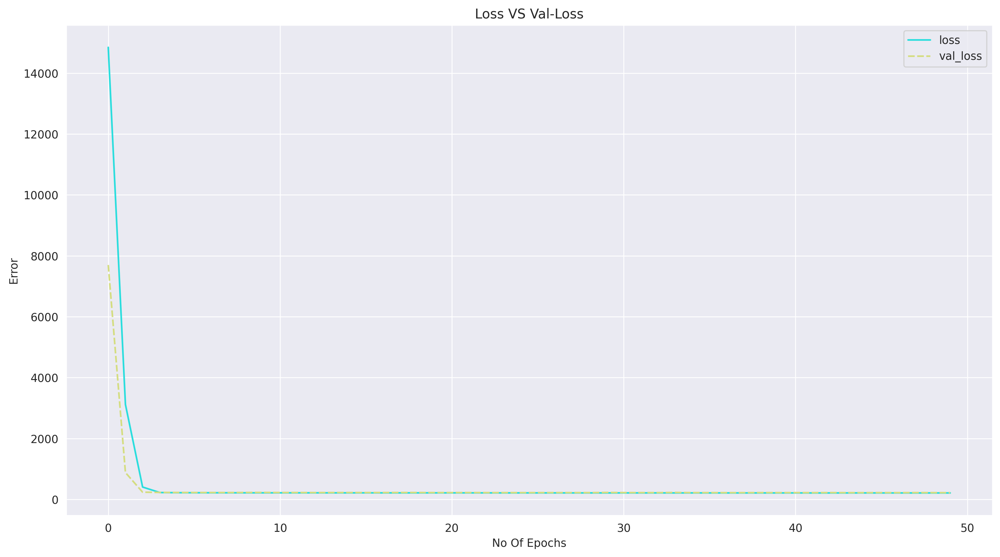

In [97]:
val_loss_def = pd.DataFrame(ann_def.history.history)

sns.lineplot(data = val_loss_def, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

**Creating Model With Early Stopping**

In [98]:
early = EarlyStopping(monitor='val_loss',mode='min', patience=25)

In [99]:
ann_es =Sequential()

In [100]:
ann_es.add(Dense(units=30, activation='linear'))
ann_es.add(Dense(units=20, activation='relu'))

In [101]:
ann_es.add(Dense(units=1))

In [102]:
ann_es.compile(optimizer='adam', loss='mse')

In [103]:
ann_es.fit(xtrain, ytrain, validation_data = (xtest, ytest), callbacks=[early] , epochs = 100)

Epoch 1/100
353/353 [==============================] - 4s 8ms/step - loss: 13801.6855 - val_loss: 6415.5039
Epoch 2/100
353/353 [==============================] - 1s 4ms/step - loss: 1999.3597 - val_loss: 323.6718
Epoch 3/100
353/353 [==============================] - 2s 4ms/step - loss: 250.9143 - val_loss: 235.4234
Epoch 4/100
353/353 [==============================] - 1s 2ms/step - loss: 223.0936 - val_loss: 232.0250
Epoch 5/100
353/353 [==============================] - 1s 2ms/step - loss: 220.1893 - val_loss: 228.2893
Epoch 6/100
353/353 [==============================] - 1s 2ms/step - loss: 219.0687 - val_loss: 227.0170
Epoch 7/100
353/353 [==============================] - 1s 2ms/step - loss: 217.9812 - val_loss: 226.9615
Epoch 8/100
353/353 [==============================] - 1s 2ms/step - loss: 217.5762 - val_loss: 228.3510
Epoch 9/100
353/353 [==============================] - 1s 2ms/step - loss: 217.1611 - val_loss: 225.1301
Epoch 10/100
353/353 [=============================

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

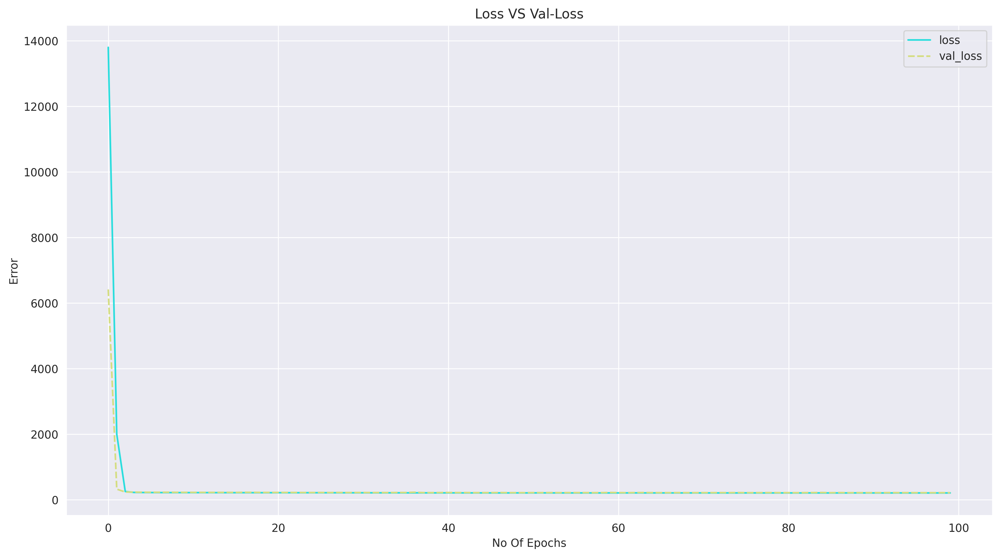

In [104]:
val_loss_es = pd.DataFrame(ann_es.history.history)

sns.lineplot(data = val_loss_es, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

**Creating Model with Drop Out Layer**

In [105]:
ann_dol =Sequential()

In [106]:
ann_dol.add(Dense(units=30, activation='linear'))
ann_dol.add(Dropout(rate=0.5))

ann_dol.add(Dense(units=20, activation='relu'))
ann_dol.add(Dropout(rate=0.5))

In [107]:
ann_dol.add(Dense(units=1))

In [108]:
ann_dol.compile(optimizer='adam', loss='mse')

In [109]:
ann_dol.fit(xtrain, ytrain, validation_data = (xtest, ytest), epochs = 50)

Epoch 1/50
353/353 [==============================] - 4s 7ms/step - loss: 15529.5811 - val_loss: 8227.7217
Epoch 2/50
353/353 [==============================] - 1s 4ms/step - loss: 4333.7280 - val_loss: 582.3986
Epoch 3/50
353/353 [==============================] - 1s 2ms/step - loss: 2614.4067 - val_loss: 527.0278
Epoch 4/50
353/353 [==============================] - 1s 3ms/step - loss: 2316.3025 - val_loss: 441.6720
Epoch 5/50
353/353 [==============================] - 1s 3ms/step - loss: 2097.2158 - val_loss: 380.9026
Epoch 6/50
353/353 [==============================] - 1s 2ms/step - loss: 1917.4049 - val_loss: 358.4073
Epoch 7/50
353/353 [==============================] - 1s 3ms/step - loss: 1835.6387 - val_loss: 353.8918
Epoch 8/50
353/353 [==============================] - 1s 3ms/step - loss: 1815.5306 - val_loss: 323.5717
Epoch 9/50
353/353 [==============================] - 1s 2ms/step - loss: 1744.2794 - val_loss: 348.9710
Epoch 10/50
353/353 [==============================] 

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

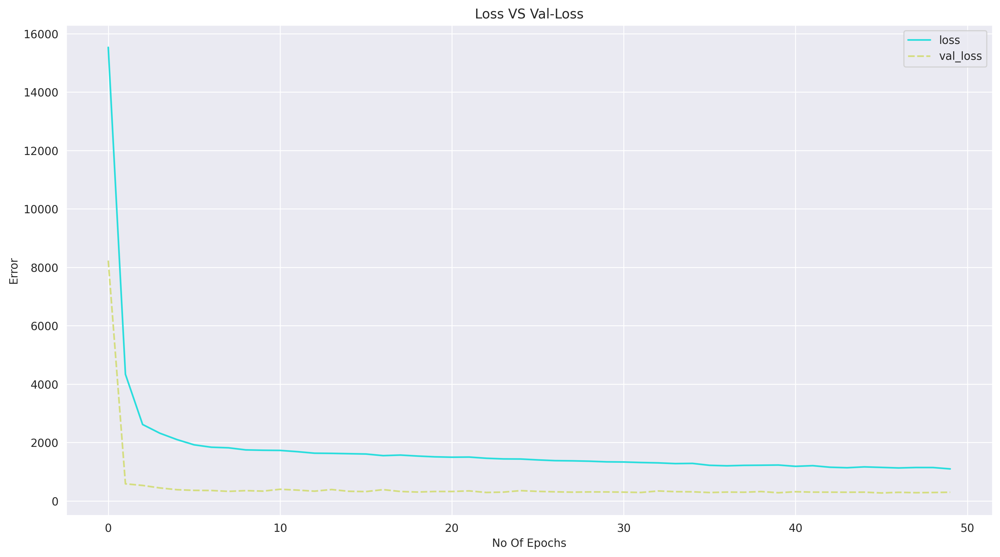

In [110]:
val_loss_dol = pd.DataFrame(ann_dol.history.history)

sns.lineplot(data = val_loss_dol, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

**Creating Model with Early Stopping and Drop Out Layer**

In [111]:
early = EarlyStopping(monitor='val_loss',mode='min', patience=25)

In [112]:
ann_all =Sequential()

In [113]:
ann_all.add(Dense(units=30, activation='linear'))
ann_all.add(Dropout(rate=0.5))

ann_all.add(Dense(units=20, activation='relu'))
ann_all.add(Dropout(rate=0.5))

In [114]:
ann_all.add(Dense(units=1))

In [115]:
ann_all.compile(optimizer='adam', loss='mse')

In [116]:
ann_all.fit(xtrain, ytrain, validation_data = (xtest, ytest), callbacks=[early] , epochs = 100)

Epoch 1/100
353/353 [==============================] - 5s 5ms/step - loss: 14754.5332 - val_loss: 7297.5693
Epoch 2/100
353/353 [==============================] - 1s 3ms/step - loss: 4860.4497 - val_loss: 1151.2943
Epoch 3/100
353/353 [==============================] - 1s 3ms/step - loss: 2925.1467 - val_loss: 547.0250
Epoch 4/100
353/353 [==============================] - 1s 3ms/step - loss: 2530.8027 - val_loss: 434.8074
Epoch 5/100
353/353 [==============================] - 1s 3ms/step - loss: 2249.5493 - val_loss: 463.5714
Epoch 6/100
353/353 [==============================] - 1s 3ms/step - loss: 2121.0325 - val_loss: 418.3911
Epoch 7/100
353/353 [==============================] - 1s 3ms/step - loss: 2025.2769 - val_loss: 417.8742
Epoch 8/100
353/353 [==============================] - 1s 3ms/step - loss: 1907.5009 - val_loss: 326.0369
Epoch 9/100
353/353 [==============================] - 1s 3ms/step - loss: 1884.9183 - val_loss: 339.1142
Epoch 10/100
353/353 [=====================

**Evaluating The Model**

Text(0.5, 0, 'No Of Epochs')

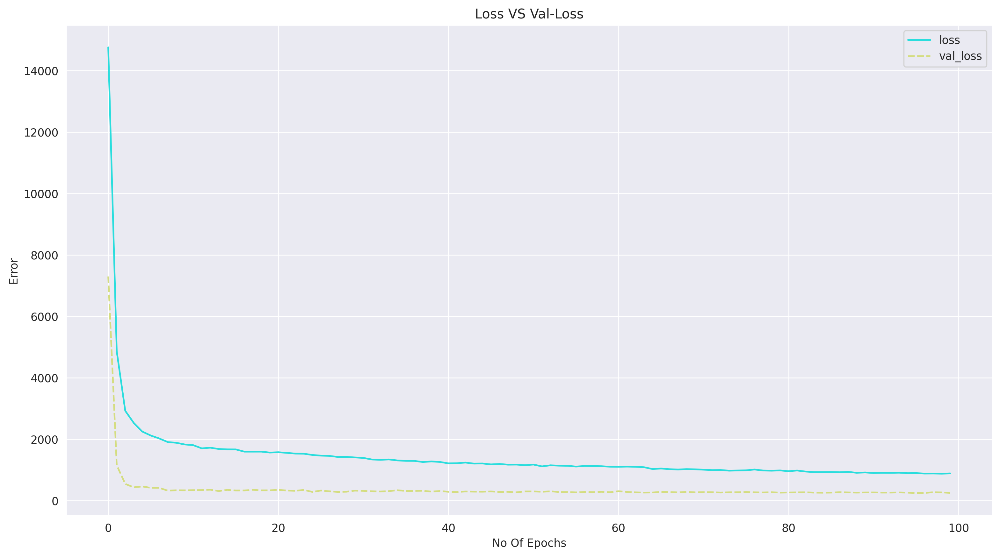

In [117]:
val_loss_all = pd.DataFrame(ann_all.history.history)

sns.lineplot(data = val_loss_all, palette='rainbow')
plt.title('Loss VS Val-Loss')
plt.ylabel('Error')
plt.xlabel('No Of Epochs')

**Comparing All Model**

<Axes: title={'center': 'Model With Early Stop And Drop Out Layer'}>

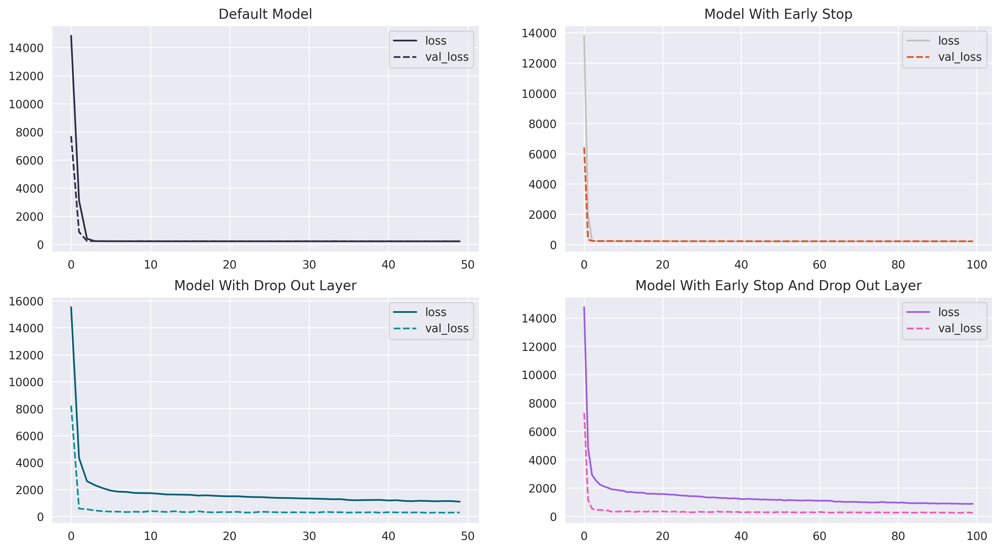

In [118]:
fig, ax = plt.subplots(2, 2)

ax[0, 0].title.set_text('Default Model')
sns.lineplot(data=val_loss_def, ax = ax[0, 0], palette = ['#2b2d42', '#2d3047'])

ax[0, 1].title.set_text('Model With Early Stop')
sns.lineplot(data=val_loss_es, ax = ax[0, 1], palette = ['#c2c1c2', '#de541e'])

ax[1, 0].title.set_text('Model With Drop Out Layer')
sns.lineplot(data=val_loss_dol, ax = ax[1, 0], palette = ['#005f73', '#0a9396'])

ax[1, 1].title.set_text('Model With Early Stop And Drop Out Layer')
sns.lineplot(data=val_loss_all, ax = ax[1, 1], palette = [ '#9b5de5', '#f15bb5'])